<a href="https://colab.research.google.com/github/erfanera/AI-in-the-Built-Environment/blob/main/GraphOperation/ACO_RoadSuggestion16_visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import matplotlib.pyplot as plt
from skimage import measure
import numpy as np
import requests

import copy
from PIL import Image
from io import BytesIO
import math
import cv2
import matplotlib.pyplot as plt
from skimage import measure
import numpy as np
import requests

from PIL import Image
from io import BytesIO

from skimage import data
import matplotlib.pyplot as plt
from skimage.util import invert
from skimage import img_as_bool, img_as_ubyte

from skimage.morphology import skeletonize, dilation, square
import imageio

import networkx as nx

import matplotlib.pyplot as plt

In [2]:


def readGitHubUrl(webAddress):
    img_url = webAddress

    # Get the image from the URL
    response = requests.get(img_url)
    img = Image.open(BytesIO(response.content)).convert('RGB')

    # Convert the image to grayscale
    bw_image = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2GRAY)
    return bw_image

In [3]:

cells = readGitHubUrl("https://raw.githubusercontent.com/erfanera/SlumImprovment/main/Images/building.png")


In [4]:


cells = 255 - cells
_, paths_mask = cv2.threshold(cells, 127, 255, cv2.THRESH_BINARY_INV)

# Morphological operations to clean up noise and enhance path structures
kernel = np.ones((5, 5), np.uint8)  # You can adjust the kernel size as needed
cleaned_paths = cv2.morphologyEx(paths_mask, cv2.MORPH_OPEN, kernel)
ret,thresh = cv2.threshold(cells,100,255,cv2.THRESH_BINARY_INV)


labels= measure.label(thresh, background=0)
bg_label = labels[0,0]
labels[labels==bg_label] = 0 # Assign background label to 0

props = measure.regionprops(labels)
centroids = np.zeros(shape=(len(np.unique(labels)),2)) # Access the coordinates of centroids


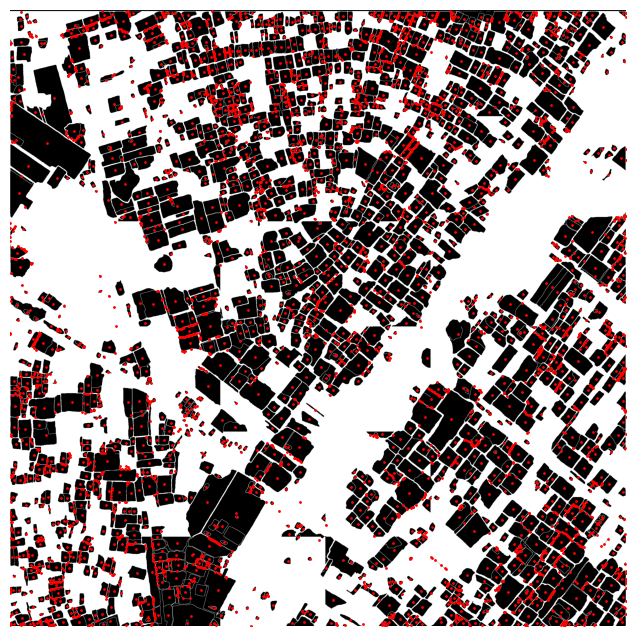

In [5]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
#plt.figure(figsize=(20, 20))
plt.axis('off')
ax.imshow(cells,cmap='gray')

for i,prop in enumerate(props):
    my_centroid = prop.centroid
    centroids[i,:]= my_centroid
    ax.plot(my_centroid[1],my_centroid[0],'r.',markersize=2)

plt.show()

In [6]:
len(centroids)

4817

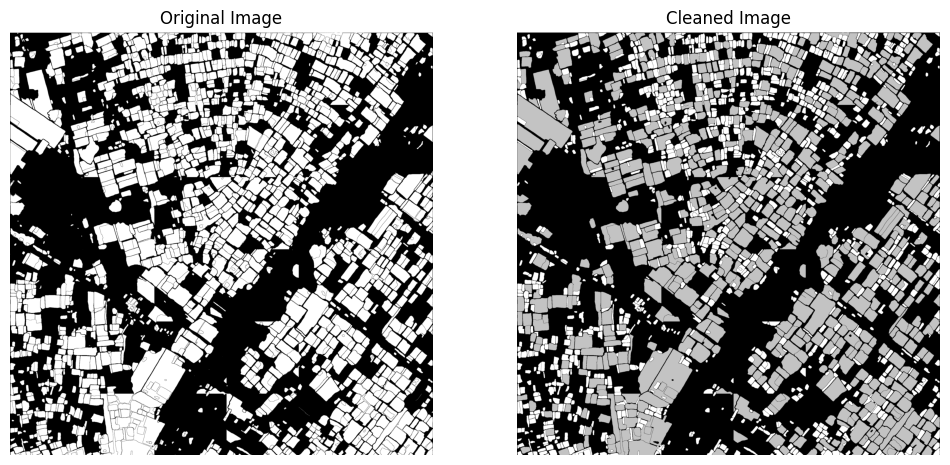

In [7]:

# Read the image and convert to binary

_, paths_mask = cv2.threshold(cells, 127, 255, cv2.THRESH_BINARY_INV)
revert = 255-cells
# Apply morphological operations to clean up noise
kernel = np.ones((5, 5), np.uint8)
cleaned_paths = cv2.morphologyEx(paths_mask, cv2.MORPH_OPEN, kernel)

# Label the connected components
labels = measure.label(cleaned_paths, background=0)
props = measure.regionprops(labels)

# Create a new image to store the cleaned cells, initially set all to background (0)
cleaned_cells = np.zeros_like(cells)

# Loop through all detected regions
for prop in props:
    if prop.area >= 200:  # Keep regions with area >= 20 pixels
        # Add the region to the cleaned_cells image
        if prop.area >=2000 :
          cleaned_cells[labels == prop.label] = 195
        else:
          cleaned_cells[labels == prop.label] = 255

# Display the original and cleaned images for comparison
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(revert, cmap='gray')
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(cleaned_cells, cmap='gray')
ax[1].set_title('Cleaned Image')
ax[1].axis('off')

plt.show()


In [8]:
height, width = cleaned_paths.shape[:2]
print(height, width)

3000 3000


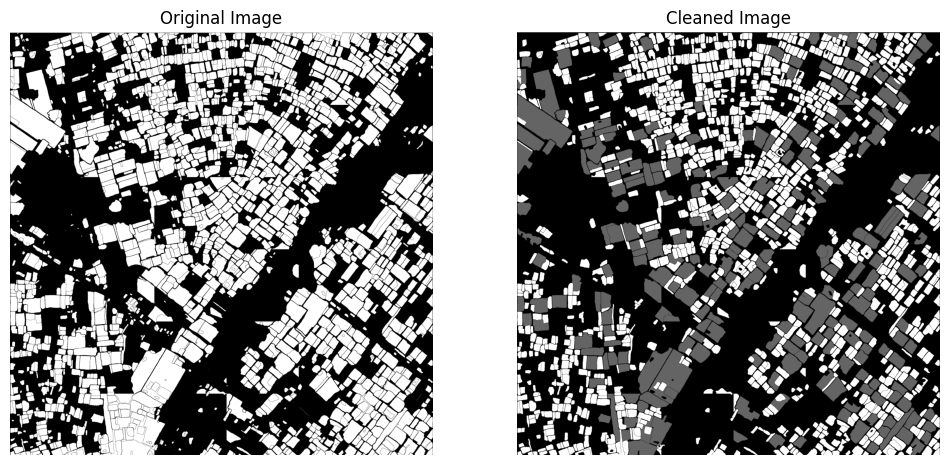

In [9]:
kernel = np.ones((5, 5), np.uint8)
cleaned_paths = cv2.morphologyEx(paths_mask, cv2.MORPH_OPEN, kernel)

# Label the connected components
labels = measure.label(cleaned_paths, background=0)
props = measure.regionprops(labels)

# Create a new image to store the cleaned cells, initially set all to background (0)
cleaned_cells = np.zeros_like(cells)
houseCentroid = []
amenityCentroid = []
# Loop through all detected regions
for prop in props:
    if prop.area >= 600:  # Keep regions with area >= 20 pixels
        center = prop.centroid
        # Add the region to the cleaned_cells image
        if prop.area >=4000 :
          cleaned_cells[labels == prop.label] = 100#[255, 255, 0]
          amenityCentroid.append(center)
        else:
          cleaned_cells[labels == prop.label] = 255
          houseCentroid.append(center)
# Display the original and cleaned images for comparison
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(revert, cmap='gray')
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(cleaned_cells, cmap='gray')
ax[1].set_title('Cleaned Image')
ax[1].axis('off')

plt.show()

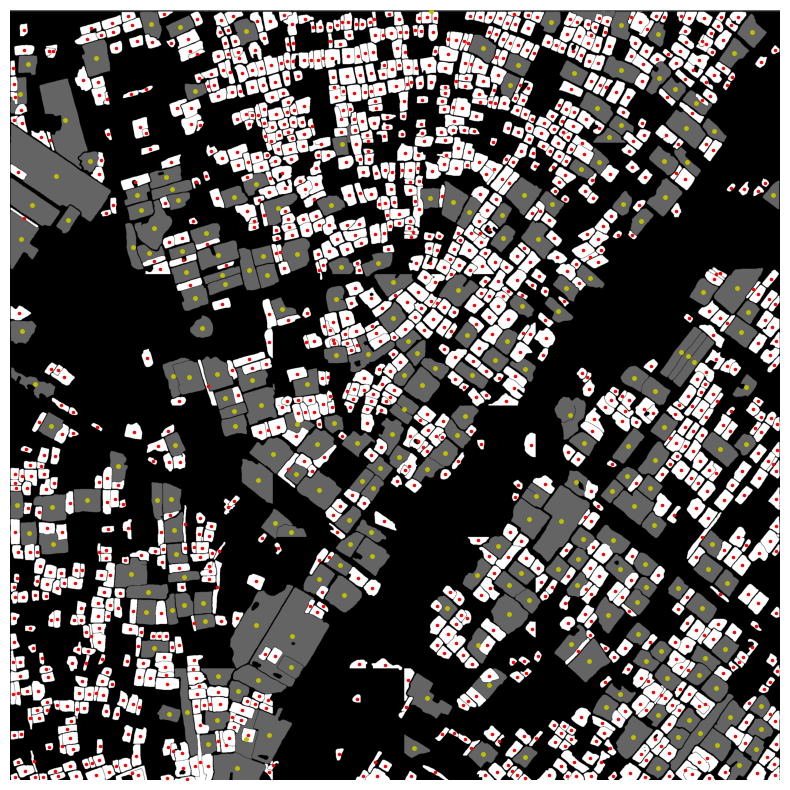

In [10]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
#plt.figure(figsize=(20, 20))
plt.axis('off')
ax.imshow(cleaned_cells,cmap='gray')

for i in (houseCentroid):
    #my_centroid = prop.centroid
    #centroids[i,:]= my_centroid
    ax.plot(i[1],i[0],'r.',markersize=3)
for i in (amenityCentroid):
    #my_centroid = prop.centroid
    #centroids[i,:]= my_centroid
    ax.plot(i[1],i[0],'y.',markersize=5  )



plt.show()

# Road Detection

###Importing the image

In [11]:

bw_image = readGitHubUrl("https://raw.githubusercontent.com/erfanera/SlumImprovment/main/Images/Shadows_Cleaned.png")


##Morphological Operation

### Morphological Operartion

In [12]:
_, paths_mask = cv2.threshold(bw_image, 127, 255, cv2.THRESH_BINARY_INV)

# Morphological operations to clean up noise and enhance path structures
kernel = np.ones((5, 5), np.uint8)  # You can adjust the kernel size as needed
cleaned_paths = cv2.morphologyEx(paths_mask, cv2.MORPH_OPEN, kernel)
cleaned_paths = cv2.dilate(cleaned_paths, kernel, iterations=2)  # Increase path width

# Optionally, find contours (which could represent paths)
contours, _ = cv2.findContours(cleaned_paths, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image for visualization
contour_img = cv2.cvtColor(bw_image, cv2.COLOR_GRAY2BGR)  # Convert to BGR to draw colored contours
#cv2.drawContours(contour_img, contours, -1, (0, 255, 0), 2)  # Draw contours in green



### Show the original and processed images

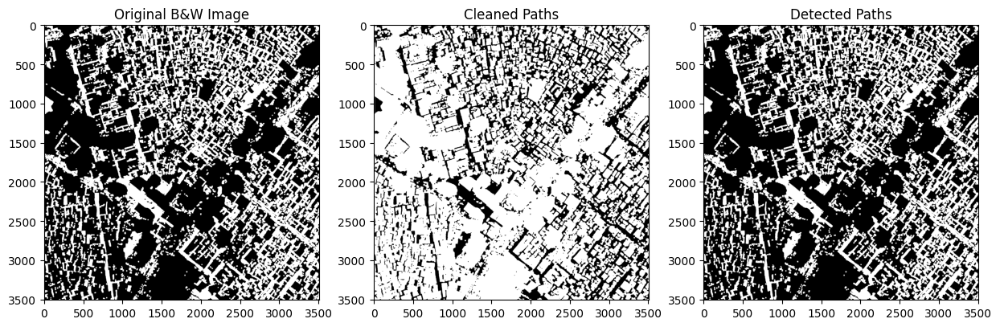

In [13]:

plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1)
plt.imshow(bw_image, cmap='gray')
plt.title('Original B&W Image')
plt.subplot(1, 3, 2)
plt.imshow(cleaned_paths, cmap='gray')
plt.title('Cleaned Paths')
plt.subplot(1, 3, 3)
plt.imshow(contour_img)
plt.title('Detected Paths')
plt.show()


##Skeletonization

###Perform Skeletonization

In [14]:
# Invert the horse image
image = invert(cleaned_paths)

# Convert image to binary (0 or 1)
binary_image = img_as_bool(image)

# Perform skeletonization
skeleton = skeletonize(binary_image)

###Visaulization

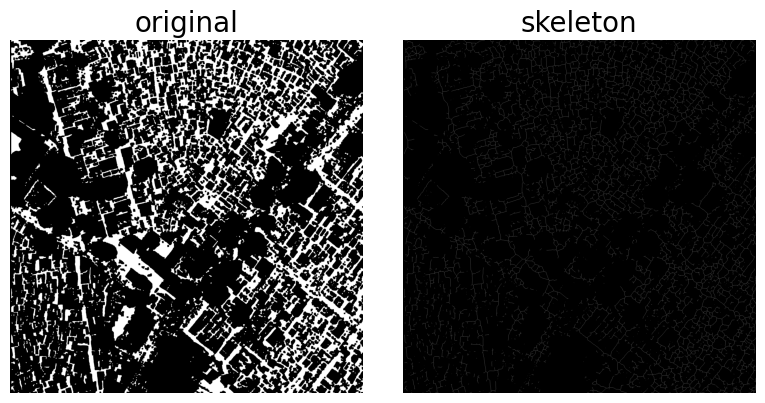

In [15]:
dilation_skeleton = dilation(skeleton, square(1))  # Change square(3) for different thickness
skeleton_uint8 = (skeleton * 255).astype(np.uint8)

# Save the formatted skeleton image
imageio.imsave('skeleton.png', skeleton_uint8)


# display results
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8, 4),
                         sharex=True, sharey=True)

ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].axis('off')
ax[0].set_title('original', fontsize=20)

ax[1].imshow(skeleton, cmap=plt.cm.gray)
ax[1].axis('off')
ax[1].set_title('skeleton', fontsize=20)

fig.tight_layout()
plt.show()

##Path Detection on skeletonize Image

In [16]:
def skeleton_to_graph2(skeleton):
    # Initialize an empty graph
    G = nx.Graph()

    # Get the dimensions of the skeleton
    rows, cols = skeleton.shape

    # Identify junctions and endpoints
    # Initialize arrays to hold the identified junctions and endpoints
    junctions = set()
    endpoints = set()

    # Define neighbor offsets for connectivity
    neighbors = [(1, 0), (1, 1), (0, 1), (-1, 1), (-1, 0), (-1, -1), (0, -1), (1, -1)]

    # Find junctions and endpoints
    for y in range(rows):
        for x in range(cols):
            if skeleton[y, x] == 1:  # If the pixel is part of the skeleton
                neighbor_count = sum(skeleton[y + dy, x + dx] for dx, dy in neighbors if 0 <= x + dx < cols and 0 <= y + dy < rows)
                if neighbor_count > 2:
                    junctions.add((x, y))
                elif neighbor_count == 1:
                    endpoints.add((x, y))

    # Add junctions and endpoints as nodes
    # Add junctions and endpoints as nodes with their positions
    for junction in junctions:
        G.add_node(junction, pos=junction)  # Store the position as an attribute
    for endpoint in endpoints:
        G.add_node(endpoint, pos=endpoint)  # Store the position as an attribute


    # Define a method to trace a line from an endpoint or junction to another node
    def trace_line(start, end=None):
        x, y = start
        line = [start]
        while True:
            for dx, dy in neighbors:
                nx, ny = x + dx, y + dy
                if (nx, ny) != end and (nx, ny) in line:
                    continue  # Avoid looping back on itself
                if 0 <= nx < cols and 0 <= ny < rows and skeleton[ny, nx] == 1:
                    if (nx, ny) in junctions or (nx, ny) in endpoints:
                        # Reached another node; stop tracing
                        return start, (nx, ny), line
                    elif (nx, ny) not in line:  # Continue tracing
                        line.append((nx, ny))
                        x, y = nx, ny
                        break
            else:
                # No more directions to move
                break
        return start, None, line  # In case of isolated segments, though unlikely

    # Trace lines between endpoints and junctions
    visited = set()
    for start in endpoints.union(junctions):
        if start not in visited:
            _, end, line = trace_line(start)
            if end:
                G.add_edge(start, end)
                visited.update(line)

    return G

In [17]:
graph = skeleton_to_graph2(skeleton)


In [18]:
G1 = copy.deepcopy(graph)
pos1 = nx.get_node_attributes(G1, 'pos')

In [19]:
main_image = readGitHubUrl("https://raw.githubusercontent.com/erfanera/SlumImprovment/main/Images/SampleSpliteSatellite.png")

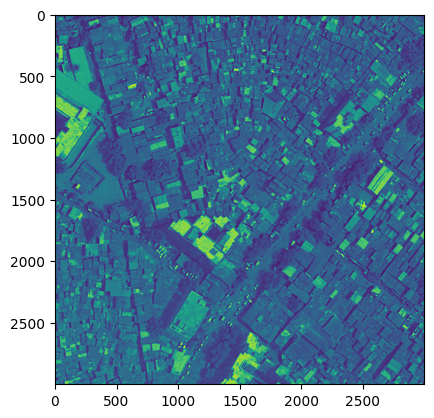

In [20]:
plt.imshow(main_image)

In [21]:
x_values, y_values = zip(*pos1.values())

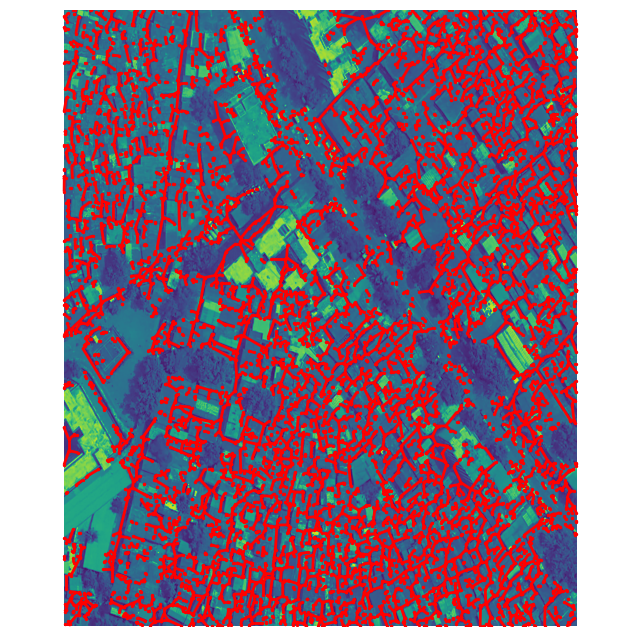

In [22]:

flipped_image = cv2.flip(main_image, 0)
plt.figure(figsize=(8, 8))

ax = plt.gca()

x_values, y_values = zip(*pos1.values())
#ax.set_xlim(min(x_values), max(x_values))
ax.set_ylim(min(y_values), max(y_values))
# If you have a background image called 'background.png', uncomment the next line
# main_image = plt.imread('background.png')
ax.imshow(flipped_image,extent=[min(x_values), max(x_values), min(y_values), max(y_values)], aspect='auto')

# Draw the network on top of the image, increase edge width and change edge color
nx.draw(G1, pos1, ax=ax, node_size=2, with_labels=False, width=2, edge_color='r', node_color= 'r')  # Change 'r' to your preferred color

plt.show()

In [23]:
def euclidean_distance(point1, point2):
    return math.sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

# Function to find the maximum distance between nodes in a cluster
def max_distance_in_cluster(graph, positions):
    max_distance = 0
    for node1 in graph:
        for node2 in graph:
            if node1 != node2:
                distance = euclidean_distance(positions[node1], positions[node2])
                max_distance = max(max_distance, distance)
    return max_distance

In [24]:


distance_threshold = 40  # Example threshold
G2 = copy.deepcopy(graph)
pos2 = nx.get_node_attributes(G2 ,'pos')
# Find all connected components
clusters = list(nx.connected_components(G2))

# Identify and remove clusters below the distance threshold
for cluster in clusters:
    subgraph = G2.subgraph(cluster)
    if max_distance_in_cluster(subgraph, pos2) < distance_threshold:
        # Remove the cluster
        for node in cluster:
            G2.remove_node(node)

# Your graph now has the small clusters removed


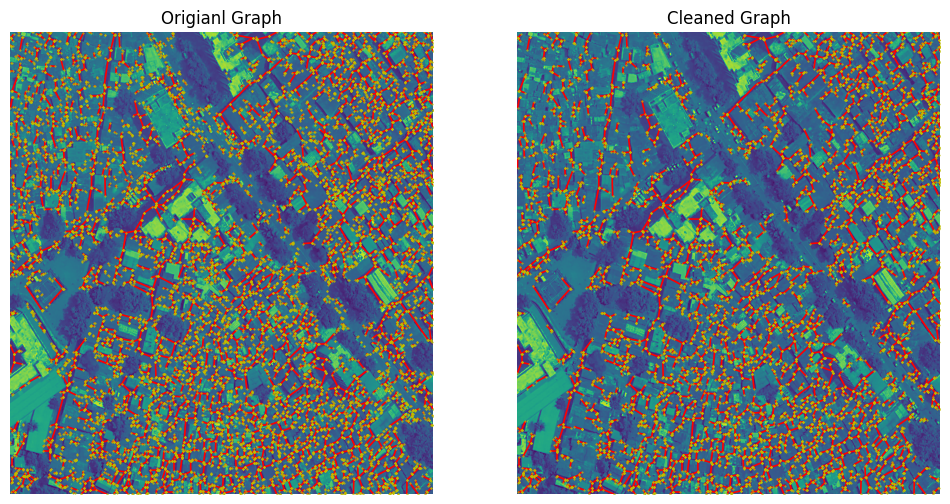

In [25]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

#ax = plt.gca()
x_values, y_values = zip(*pos1.values())
ax[0].set_xlim(min(x_values), max(x_values))
ax[0].set_ylim(min(y_values), max(y_values))

x_values1, y_values1 = zip(*pos2.values())
ax[1].set_xlim(min(x_values1), max(x_values1))
ax[1].set_ylim(min(y_values1), max(y_values1))


ax[0].imshow(flipped_image, extent=[min(x_values1), max(x_values1), min(y_values1), max(y_values1)], aspect='auto')
ax[1].imshow(flipped_image,extent=[min(x_values), max(x_values), min(y_values), max(y_values)], aspect='auto')

nx.draw(G1, pos1, ax=ax[0], node_size=0.2, with_labels=False, width=1.2, edge_color='r', node_color= 'y')
nx.draw(G2, pos2, ax=ax[1], node_size=0.2, with_labels=False, width=1.2, edge_color='r', node_color= 'y')
ax[1].set_title('Cleaned Graph')
ax[0].set_title('Origianl Graph')
# Draw the network on top of the image, increase edge width and change edge color
  # Change 'r' to your preferred color

plt.show()

In [26]:
data =np.array(houseCentroid)
x_min2, x_max2 = data[:, 0].min(), data[:, 0].max()
y_min2, y_max2 = data[:, 1].min(), data[:, 1].max()

# Print the results
print("Bounds for x: ", x_min2, x_max2)
print("Bounds for y: ", y_min2, y_max2)

height, width = image.shape[:2]
print(height, width)

Bounds for x:  13.56806282722513 2993.8271144278606
Bounds for y:  10.303 2988.6260273972603
3508 3508


"""
Given:

- \( H \) = height of the image
- \( y \) = original y-coordinate of a point

The new y-coordinate after vertical flip, \( y' \), is calculated as:

\[ y' = H - 1 - y \]
"""

In [27]:
height, width = image.shape[:2]
data = np.array(houseCentroid)

# Flip the points vertically based on the image height
data[:, 1] = height - 1 - data[:, 1]

# Convert back to list of tuples if needed
flipped_tuples_list = list(map(tuple, data))

In [28]:
x_values, y_values = zip(*pos1.values())
print(max(x_values), max(y_values))

3506 3506


In [29]:


def connect_new_points_to_graph(graph, new_points):
    """
    Creates a new graph where each new point is connected to the closest node from the original graph.

    :param graph: A NetworkX graph where nodes have a 'pos' attribute containing their coordinates.
    :param new_points: A list of tuples, where each tuple represents the coordinates of a new point.
    :return: A new NetworkX graph with only the new points and their closest existing nodes.
    """
    # Create a new graph to store results
    new_graph = nx.Graph()

    for point in new_points:
        closest_node = None
        min_distance = float('inf')

        # Calculate the distance of the point to each node in the graph
        for node in graph.nodes():
            node_pos = graph.nodes[node]['pos']
            distance = math.sqrt((node_pos[0] - point[0]) ** 2 + (node_pos[1] - point[1]) ** 2)

            # Update the closest node if this node is closer
            if distance < min_distance:
                closest_node = node
                min_distance = distance

        # Connect the point to the closest node in the new graph
        if closest_node is not None:
            new_graph.add_node(closest_node, pos=graph.nodes[closest_node]['pos'])  # Add the closest node
            new_graph.add_node(point, pos=point)  # Add the new point
            new_graph.add_edge(closest_node, point, weight=min_distance)  # Add an edge between them

    return new_graph


In [30]:


x_values2, y_values2 = zip(*pos2.values())
def remapTouple(toupeList):
  # Convert list of tuples into a NumPy array
  data = np.array(toupeList)

  # Old min and max
  old_x_min, old_x_max = data[:, 0].min(), data[:, 0].max()
  old_y_min, old_y_max = data[:, 1].min(), data[:, 1].max()

  # New min and max for mapping
  new_x_min, new_x_max = min(x_values2), max(x_values2)  # Change these to your desired range for x
  new_y_min, new_y_max = min(y_values2), max(y_values2)# Change these to your desired range for y

  # Apply linear transformation to map points to the new range
  data[:, 0] = (data[:, 0] - old_x_min) / (old_x_max - old_x_min) * (new_x_max - new_x_min) + new_x_min
  data[:, 1] = (data[:, 1] - old_y_min) / (old_y_max - old_y_min) * (new_y_max - new_y_min) + new_y_min

  # Convert back to list of tuples if needed
  mapped_tuples_list = list(map(tuple, data))
  return mapped_tuples_list
# Print the results
MappedhouseCentroid = remapTouple(houseCentroid)
MappedamenityCentroid = remapTouple(amenityCentroid)
print("Mapped points:", MappedhouseCentroid)


Mapped points: [(15.468717891801452, 694.7292718132683), (15.703617604072523, 1725.9483849879732), (26.950853254481416, 2142.5529959060254), (13.0, 2300.7798352172977), (35.63942390845817, 845.5847645317615), (25.100771634453555, 1009.3801849986995), (46.695476316962356, 1178.6422609210963), (20.859315485757364, 1245.9691337459114), (37.699075305873116, 1658.7331753938274), (37.23693068423438, 1769.1333442200241), (30.752728189216565, 1897.7951079061202), (31.25729209803136, 1937.6878979130959), (22.89145354535561, 2096.5703360028206), (30.036218991470577, 2187.859671038875), (33.995667849069164, 2234.7060914622148), (19.97883149607512, 2362.346416873645), (26.97304130491289, 2405.8399171331866), (29.696108967813238, 2837.626615591115), (52.693147160362564, 2875.6061874118864), (22.800351212143504, 2951.54171786797), (29.82387366600946, 2988.0641353019023), (21.931542174647042, 3063.3644933771493), (32.9619843310865, 3103.5686506228567), (34.529013336055314, 3171.3808892813454), (27.26

In [31]:


# Convert list of tuples into a NumPy array
Swapped_MappedhouseCentroid = [(y, x) for x, y in MappedhouseCentroid]
Swapped_MappedamenityCentroid = [(y, x) for x, y in MappedamenityCentroid ]

graph_walk = connect_new_points_to_graph(G2, Swapped_MappedhouseCentroid)
pos3 = nx.get_node_attributes(graph_walk ,'pos')

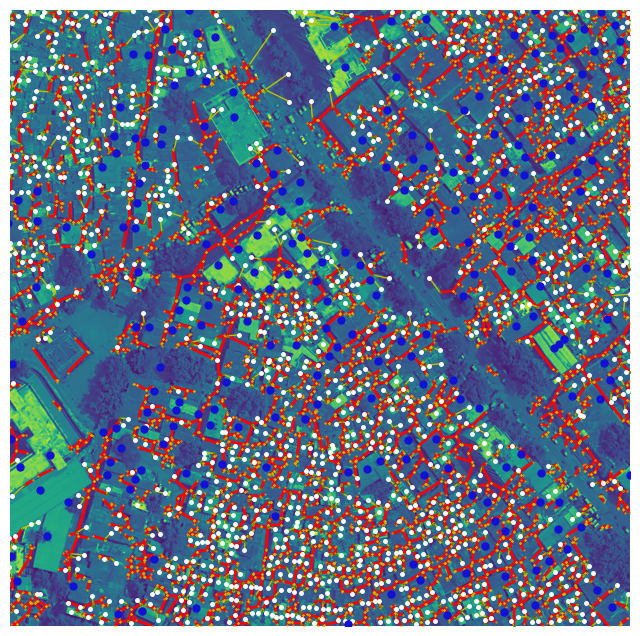

In [32]:

plt.figure(figsize=(8, 8))

ax = plt.gca()

ax.set_xlim(min(x_values2), max(x_values2))
ax.set_ylim(min(y_values2), max(y_values2))
# If you have a background image called 'background.png', uncomment the next line
# main_image = plt.imread('background.png')
ax.imshow(flipped_image,extent=[min(x_values2), max(x_values2), min(y_values2), max(y_values2)], aspect='auto')

# Draw the network on top of the image, increase edge width and change edge color
nx.draw(G2, pos2, ax=ax, node_size=0.2, with_labels=False, width=2, edge_color='r', node_color= 'y')
nx.draw(graph_walk, pos3, ax=ax, node_size=0.2, with_labels=False, width=1, edge_color='y', node_color= 'g')
ax.plot(1200,1200,markersize =299)
for i in (MappedhouseCentroid):

    ax.plot(i[1],i[0],'w.',markersize=5  )
for i in (MappedamenityCentroid):

    ax.plot(i[1],i[0],'.',markersize=10 , color =  "#1111d4")
plt.show()

In [33]:
def connect_new_points_to_graph2(graph, houses, amenities):

    # Create a new graph to store results
    new_graph = copy.deepcopy(graph)

    for point in houses:
        closest_node = None
        min_distance = float('inf')
        new_graph.add_node(point, function="house", pos = point)# Calculate the distance of the point to each node in the graph
        for node in graph.nodes():
            node_pos = graph.nodes[node]['pos']
            distance = math.sqrt((node_pos[0] - point[0]) ** 2 + (node_pos[1] - point[1]) ** 2)

            # Update the closest node if this node is closer
            if distance < min_distance:
                closest_node = node
                min_distance = distance

        # Connect the point to the closest node in the new graph
        if closest_node is not None:

            new_graph.add_node(closest_node, pos=graph.nodes[closest_node]['pos'])  # Add the closest node
            new_graph.add_node(point, pos=point, function = "house")  # Add the new point
            new_graph.add_edge(closest_node, point, weight=min_distance, function = "house")  # Add an edge between them
    for point in amenities:
        closest_node = None
        min_distance = float('inf')
        new_graph.add_node(point, function="amenity", pos = point)# Calculate the distance of the point to each node in the graph
        for node in graph.nodes():
            node_pos = graph.nodes[node]['pos']
            distance = math.sqrt((node_pos[0] - point[0]) ** 2 + (node_pos[1] - point[1]) ** 2)

            # Update the closest node if this node is closer
            if distance < min_distance:
                closest_node = node
                min_distance = distance

        # Connect the point to the closest node in the new graph
        if closest_node is not None:

            new_graph.add_node(closest_node, pos=graph.nodes[closest_node]['pos'])  # Add the closest node
            new_graph.add_node(point, pos=point, function = "amenity")  # Add the new point
            new_graph.add_edge(closest_node, point, weight=min_distance, function = "amenity")  # Add an edge between them


    return new_graph

In [34]:
full_Graph = connect_new_points_to_graph2(G2, Swapped_MappedhouseCentroid, Swapped_MappedamenityCentroid)
pos4 = nx.get_node_attributes(full_Graph ,'pos')

for node, attrs in full_Graph.nodes(data=True):
    if 'function' not in attrs:  # Check if 'function' attribute is missing
        full_Graph.nodes[node]['function'] = 'None'
for u, v, attrs in full_Graph.edges(data=True):
    if 'function' not in attrs:  # Check if 'function' attribute is missing
        full_Graph.edges[u, v]['function'] = 'None'

In [35]:
from urllib.request import urlopen
import io
url = "https://raw.githubusercontent.com/erfanera/SlumImprovment/5e6ec53cac195f093ddc7cb1342eb69a60e1bfaa/Images/road%20path%20graph'2.png"  # Replace this with your GitHub link
image_file = urlopen(url)
image = Image.open(io.BytesIO(image_file.read()))

In [36]:
import matplotlib.image as mpimg

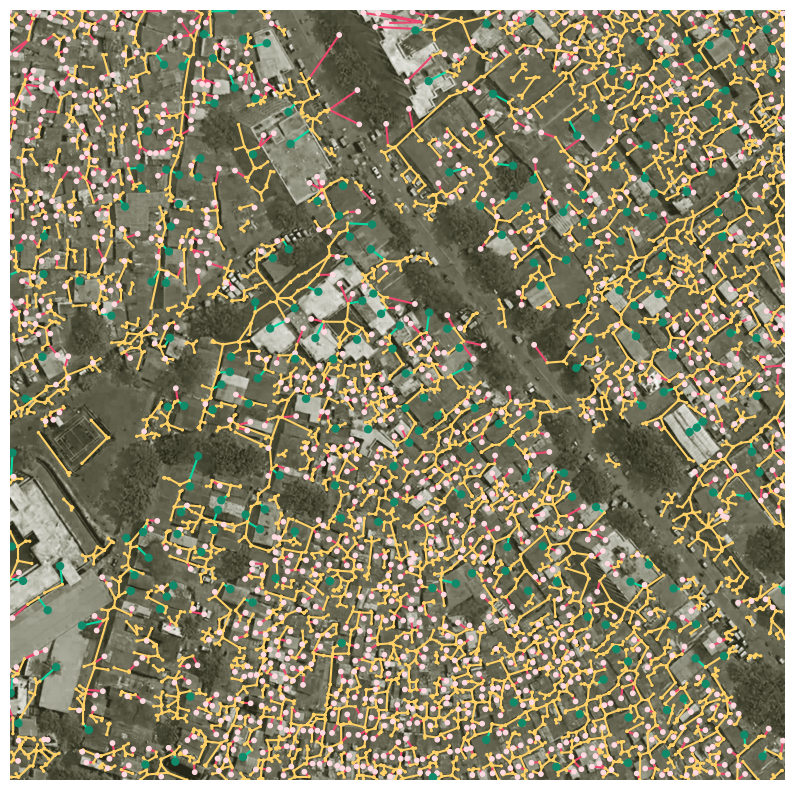

In [37]:
node_colors = {
    'None': '#FFD166',
    'house': '#FFDBE1',
    'amenity': '#118A69'
}

node_size = {
    'None': 2,
    'house':10,
    'amenity': 25
}

edge_colors = {
    'None': '#FFD166',
    'house': '#EF476F',
    'amenity': '#06D6A0'
}

# Get the color for each node and edge based on their 'function' attribute
node_size_map = [node_size[full_Graph.nodes[node].get('function', 'None')] for node in full_Graph.nodes()]
node_color_map = [node_colors[full_Graph.nodes[node].get('function', 'None')] for node in full_Graph.nodes()]
edge_color_map = [edge_colors[full_Graph.edges[edge].get('function', 'None')] for edge in full_Graph.edges()]

fig = plt.figure(figsize=(10,10))
#nx.draw(full_Graph, pos4 ,node_color=node_color_map, edge_color=edge_color_map, with_labels=False)

ax = plt.gca()

ax.set_xlim(min(x_values2), max(x_values2))
ax.set_ylim(min(y_values2), max(y_values2))
# If you have a background image called 'background.png', uncomment the next line
# main_image = plt.imread('background.png')

ax.imshow(image,extent=[min(x_values2), max(x_values2), min(y_values2), max(y_values2)], aspect='auto')
nx.draw(full_Graph, pos4, ax=ax, node_size=node_size_map, with_labels=False, width=1.5, edge_color=edge_color_map, node_color=node_color_map)
plt.show()
fig.savefig('my_figure.png', format='png', dpi=300, bbox_inches='tight')
plt.close()

In [38]:
#print(f"Subgraph {1} contains nodes: {list(full_Graph.nodes(data=True))}")
house_nodes = {node for node, attr in full_Graph.nodes(data=True) if attr.get('function') == 'house'}


In [39]:


# Read the background image
background = mpimg.imread('my_figure.png')

In [40]:
scores = []

In [41]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


$$
C' = \alpha \times RS + \beta \times CS + \delta \times PS - \gamma \times \frac{1}{L + \epsilon}
$$
:
- $RS$ is the Reachability Score, reflecting the overall connectivity between houses and amenities.
- $CS$ is the Coverage Score, indicating the proportion of houses within a walkable distance from any amenity.
- $PS$ is the Proximity Score, representing the average ease of access to amenities.
- $L$ is the total length of all edges in the graph, representing infrastructural costs.
- $\alpha$, $\beta$, $\delta$, $\gamma$ are weighting coefficients that balance the importance of each component within the cost function.
- $\epsilon$ is a small constant (e.g., $1e-5$) added to prevent division by zero and maintain numerical stability.


In [42]:
def calculate_cost_function(RS, CS, PS, L, alpha, beta, delta, gamma, epsilon=1e-5):

    # Calculate the enhanced cost function
    C_prime = alpha * RS + beta * CS + delta * PS - gamma * (1 / (L + epsilon))
    return C_prime

In [43]:
# import networkx as nx
# import numpy as np



# def calculate_reachability_scores(graph, house_nodes, amenity_nodes, walkable_distance):
#     connected_houses = 0
#     house_to_amenity_distances = {}
#     for house in house_nodes:
#         shortest_paths = nx.single_source_dijkstra_path_length(graph, source=house, weight='length')
#         amenity_distances = {node: dist for node, dist in shortest_paths.items() if node in amenity_nodes}
#         if amenity_distances:
#             house_to_amenity_distances[house] = min(amenity_distances.values())
#         for path in nx.all_simple_paths(graph, source=house, target=amenity_nodes, cutoff=2):  # Adjust cutoff based on real scenarios
#             if path:
#                 connected_houses += 1
#                 break

#     houses_within_walkable_distance = len([dist for dist in house_to_amenity_distances.values() if dist <= walkable_distance])
#     if house_nodes:
#         coverage_score = houses_within_walkable_distance / len(house_nodes)
#         reachability_score = connected_houses / len(house_nodes)
#     else:
#         coverage_score = reachability_score = 0

#     return coverage_score, reachability_score

# def add_edge_and_test(graph, node1, node2, house_nodes, amenity_nodes, walkable_distance):

#     edge_length  = 1/graph[node1][node2]["eta"]

#     coverage_score, reachability_score = calculate_reachability_scores(graph, house_nodes, amenity_nodes, walkable_distance)

#     cost_function = calculate_cost_function(reachability_score, coverage_score, 1 - coverage_score, edge_length, 1, 1, 1, 1)  # adjust parameters based on your scoring function

#     return cost_function




# import networkx as nx

# def calculate_reachability_scores(graph, house_nodes, amenity_nodes, walkable_distance):
#     connected_houses = 0
#     house_to_amenity_distances = {}

#     for house in house_nodes:
#         # Compute shortest path lengths from house to all other nodes
#         shortest_paths = nx.single_source_dijkstra_path_length(graph, source=house, weight='length')

#         # Filter distances to only include amenity nodes and find the minimum distance
#         amenity_distances = {node: dist for node, dist in shortest_paths.items() if node in amenity_nodes}
#         if amenity_distances:
#             min_distance = min(amenity_distances.values())
#             house_to_amenity_distances[house] = min_distance
#             # If the minimum distance is within walkable distance, the house is connected to at least one amenity
#             if min_distance <= walkable_distance:
#                 connected_houses += 1

#     # Calculate coverage and reachability scores
#     houses_within_walkable_distance = len([dist for dist in house_to_amenity_distances.values() if dist <= walkable_distance])
#     total_houses = len(house_nodes)
#     coverage_score = houses_within_walkable_distance / total_houses if total_houses else 0
#     reachability_score = connected_houses / total_houses if total_houses else 0

#     return coverage_score, reachability_score

# def add_edge_and_test(graph, node1, node2, house_nodes, amenity_nodes, walkable_distance):
#     # Presumably, you would update graph here with a new edge or update an existing edge's weight
#     #graph.add_edge(node1, node2, length=1/graph[node1][node2]["eta"])

#     # Recalculate scores after updating the graph
#     coverage_score, reachability_score = calculate_reachability_scores(graph, house_nodes, amenity_nodes, walkable_distance)

#     # Calculate cost function based on scores and edge length
#     edge_length = 1 / graph[node1][node2]["eta"]
#     cost_function = calculate_cost_function(reachability_score, coverage_score, 1 - coverage_score, edge_length, 1, 1, 1, 1)  # Adjust parameters

#     return cost_function


import networkx as nx
import numpy as np
from concurrent.futures import ThreadPoolExecutor

def calculate_reachability_scores_parallel(graph, house_nodes, amenity_nodes, walkable_distance, num_workers=4):
    # Thread worker function
    def worker(house):
        try:
            # Stop as soon as we find an amenity within the walkable distance
            for target in amenity_nodes:
                if nx.has_path(graph, house, target):
                    path_length = nx.dijkstra_path_length(graph, source=house, target=target, weight='length')
                    if path_length <= walkable_distance:
                        return 1, path_length  # connected, distance
        except nx.NetworkXNoPath:
            pass
        return 0, float('inf')  # not connected, no path found

    with ThreadPoolExecutor(max_workers=num_workers) as executor:
        results = list(executor.map(worker, house_nodes))

    connected_houses = sum(result[0] for result in results)
    house_to_amenity_distances = [result[1] for result in results if result[1] != float('inf')]

    total_houses = len(house_nodes)
    houses_within_walkable_distance = len([dist for dist in house_to_amenity_distances if dist <= walkable_distance])
    coverage_score = houses_within_walkable_distance / total_houses if total_houses else 0
    reachability_score = connected_houses / total_houses if total_houses else 0

    return coverage_score, reachability_score
def add_edge_and_test2(graph, node1, node2, house_nodes, amenity_nodes, walkable_distance):
  # Presumably, you would update graph here with a new edge or update an existing edge's weight
  #graph.add_edge(node1, node2, length=1/graph[node1][node2]["eta"])

  # Recalculate scores after updating the graph
  coverage_score, reachability_score = calculate_reachability_scores_parallel(graph, house_nodes, amenity_nodes, walkable_distance)

  # Calculate cost function based on scores and edge length
  edge_length = 1 / graph[node1][node2]["eta"]
  cost_function = calculate_cost_function(reachability_score, coverage_score, 1 - coverage_score, edge_length, 1, 1, 1, 1)  # Adjust parameters

  return cost_function, coverage_score ,reachability_score, edge_length


In [44]:
all_have_position = all('pos' in full_Graph.nodes[node] for node in full_Graph.nodes)
print(all_have_position)

True


In [45]:
nodes_with_one_connection = [node for node, degree in dict(full_Graph.degree()).items() if degree == 1]
import random

In [46]:
# Function to calculate Euclidean distance between two points
def calculate_distance(pos1, pos2):
    return math.sqrt((pos1[0] - pos2[0]) ** 2 + (pos1[1] - pos2[1]) ** 2)

def find_two_nodes_preferred_distance(G, preferred_max_distance=2000, max_attempts=100):
    nodes = list(G.nodes(data=True))
    if len(nodes) < 2:
        return None  # Not enough nodes to find a pair

    # First, try to find a pair within the preferred maximum distance
    for _ in range(max_attempts):
        node1 = random.choice(nodes)
        eligible_nodes = [node2 for node2 in nodes if calculate_distance(node1[1]['pos'], node2[1]['pos']) <= preferred_max_distance and node1 != node2]
        if eligible_nodes:
            return node1[0], random.choice(eligible_nodes)[0]

    # If no such pair is found, select any two distinct nodes
    if len(nodes) > 1:
        node1, node2 = random.sample(nodes, 2)  # Ensure two distinct nodes are chosen
        return node1[0], node2[0]

    return None

In [47]:
coverage_scores = []
proximity_scores= []
reachability_scores = []
edge_lengths = []


<ipython-input-48-47e0cd5e2ad8>:19: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image_resized = image_bright.resize(new_size, Image.ANTIALIAS)  # ANTIALIAS is a high-quality downsampling filter


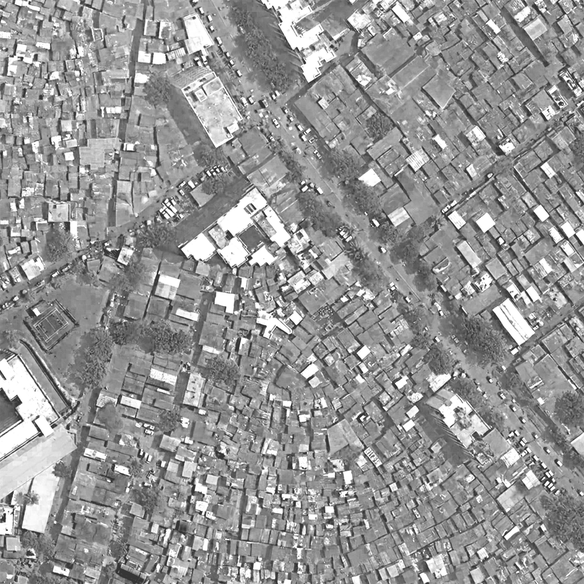

In [48]:
from PIL import Image, ImageEnhance

# Load the image
image2 = image

# Convert to grayscale


# Enhance the saturation (Note: Grayscale images do not have color to enhance)
# enhancer = ImageEnhance.Color(image2)  # Not applicable for grayscale images
# image_saturated = enhancer.enhance(-0.0)  # This would have no effect on a grayscale image

# Enhance the brightness
enhancer = ImageEnhance.Brightness(image2)
image_bright = enhancer.enhance(1.5)  # Increase brightness (1.0 is original)

# Reduce the resolution by specifying new dimensions
new_size = (image_bright.width // 6, image_bright.height // 6)  # For example, half the original dimensions
image_resized = image_bright.resize(new_size, Image.ANTIALIAS)  # ANTIALIAS is a high-quality downsampling filter
image_resized = image_resized.convert('L')
# Show the modified image
display(image_resized)

# Optionally, save the modified image
image_resized.save('enhanced_plot.png')
test = cv2.imread('enhanced_plot.png')

In [49]:
import networkx as nx
from sklearn.cluster import KMeans
import numpy as np

def cluster_graph(graph, n_clusters):
    # Extract node positions and other attributes
    positions = np.array([graph.nodes[node]['pos'] for node in graph.nodes])

    # Perform k-means clustering based on positions
    kmeans = KMeans(n_clusters=n_clusters , random_state = 43)
    clusters = kmeans.fit_predict(positions)

    # Create a mapping of node to cluster
    node_cluster_mapping = {node: cluster for node, cluster in zip(graph.nodes, clusters)}

    # Create subgraphs based on clusters
    subgraphs = [graph.subgraph([node for node in graph if node_cluster_mapping[node] == i]) for i in range(n_clusters)]

    # Ensure each subgraph retains the original attributes and edges
    for subgraph in subgraphs:
        for node in subgraph:
            subgraph.nodes[node].update(graph.nodes[node])

    return subgraphs

In [50]:
import networkx as nx
from sklearn.cluster import KMeans
import numpy as np

def cluster_graph(graph, n_clusters):
    # Extract node positions
    positions = np.array([graph.nodes[node]['pos'] for node in graph.nodes()])

    # Perform k-means clustering based on positions
    kmeans = KMeans(n_clusters=n_clusters , random_state = 43)
    clusters = kmeans.fit_predict(positions)

    # Create a mapping of node to cluster
    node_cluster_mapping = {node: cluster for node, cluster in zip(graph.nodes(), clusters)}

    # Create subgraphs based on clusters
    subgraphs = [graph.subgraph([node for node in graph if node_cluster_mapping[node] == i]) for i in range(n_clusters)]

    return subgraphs


In [112]:
numberOfClusters = 6
chosenOne = 1

In [113]:

subgraphs = cluster_graph(full_Graph, numberOfClusters)
for i, sg in enumerate(subgraphs):
    print(f"Subgraph {i+1} contains nodes: {list(sg.nodes(data=True))}")

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Subgraph 1 contains nodes: [((2603, 3115), {'pos': (2603, 3115), 'function': 'None'}), ((3410, 2686), {'pos': (3410, 2686), 'function': 'None'}), ((2579, 2529), {'pos': (2579, 2529), 'function': 'None'}), ((2978, 3178), {'pos': (2978, 3178), 'function': 'None'}), ((3174, 2824), {'pos': (3174, 2824), 'function': 'None'}), ((2154, 2880), {'pos': (2154, 2880), 'function': 'None'}), ((2202, 2807), {'pos': (2202, 2807), 'function': 'None'}), ((3417, 2810), {'pos': (3417, 2810), 'function': 'None'}), ((3194, 3067), {'pos': (3194, 3067), 'function': 'None'}), ((2972, 2954), {'pos': (2972, 2954), 'function': 'None'}), ((2687, 3379), {'pos': (2687, 3379), 'function': 'None'}), ((3010, 2837), {'pos': (3010, 2837), 'function': 'None'}), ((2427, 2516), {'pos': (2427, 2516), 'function': 'None'}), ((1930, 2613), {'pos': (1930, 2613), 'function': 'None'}), ((3425, 2936), {'pos': (3425, 2936), 'function': 'None'}), ((3418, 2811), {'pos': (3418, 2811), 'function': 'None'}), ((3348, 3390), {'pos': (3348

In [114]:
theGraph =copy.deepcopy( subgraphs[chosenOne])

In [115]:
import random
def generate_alpha(numCluster,  chosenOne):
  alphaMap = []
  for i in range(numCluster):
    if i== chosenOne:
      alphaMap.append(1)
    else:
      alphaMap.append(0)
  return alphaMap

def generate_hex_colors(n):
    """Generate a list of n random hex color strings."""
    hex_colors = []
    for i in range(n):

        # Generate a random color
        color = "#{:06x}".format(random.randint(0, 0xFFFFFF))
        hex_colors.append(color)
    hex_colors[chosenOne+1] = "Orange"
    return hex_colors

# Example: Generate a list of 10 random hex color strings


In [116]:
color_list = generate_hex_colors(numberOfClusters+1)
alphaMap = generate_alpha(numberOfClusters , chosenOne)

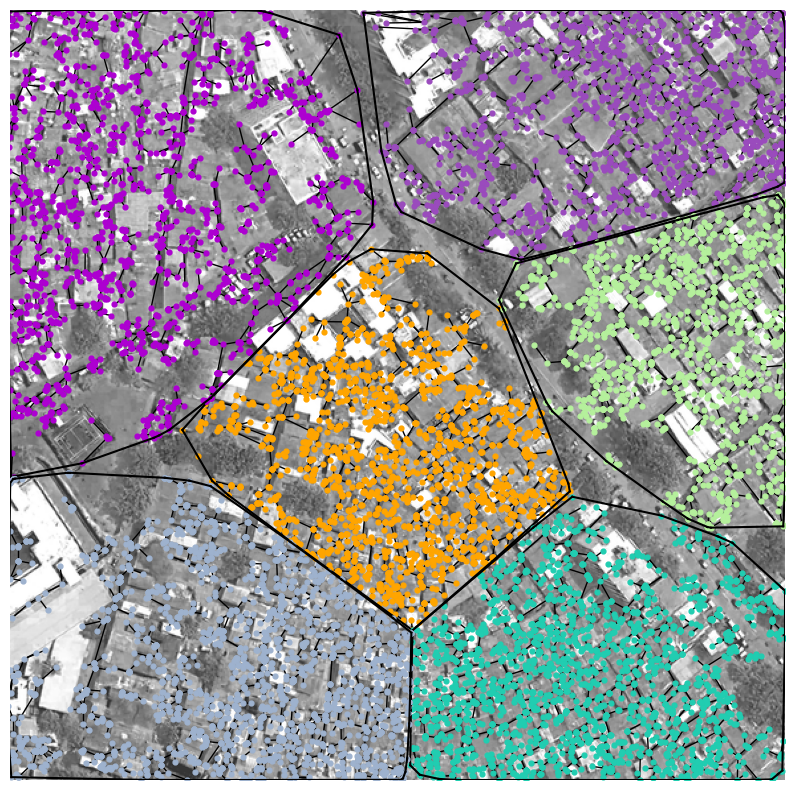

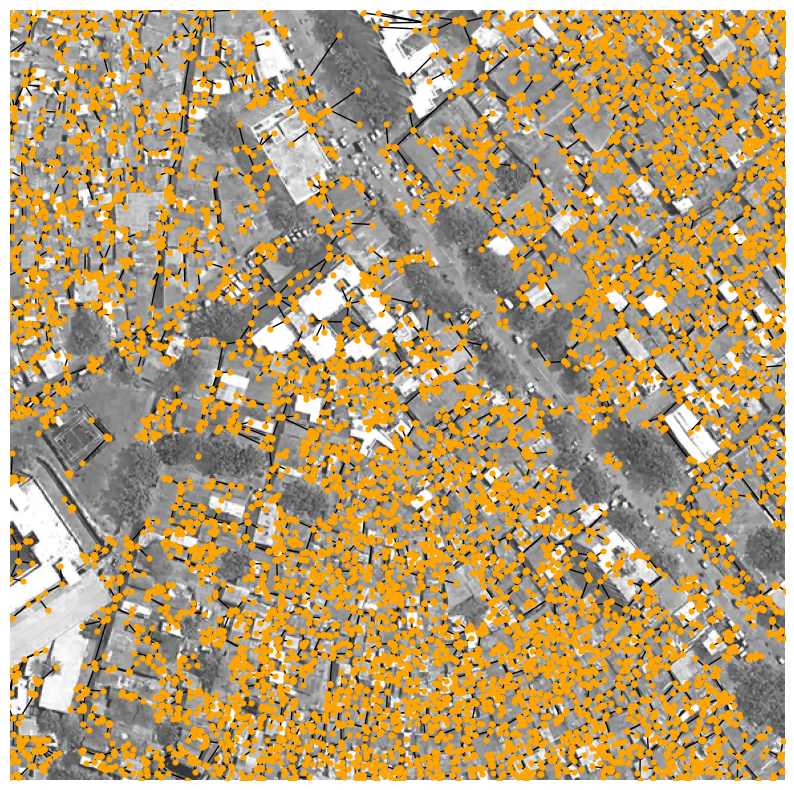

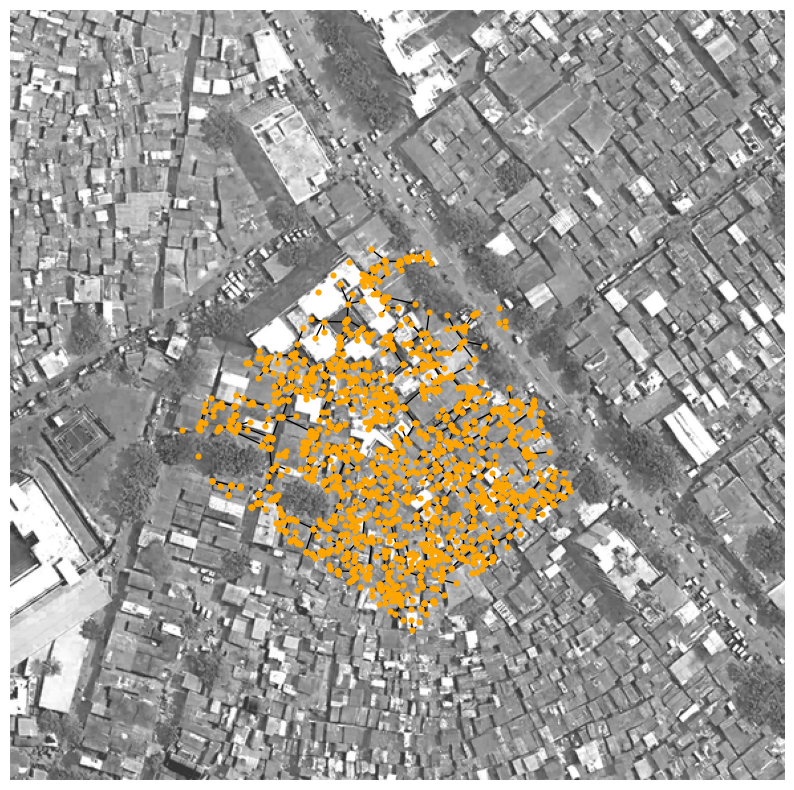

In [131]:
fig = plt.figure(figsize=(10,10))
ax = plt.gca()
ax.set_xlim(min(x_values2), max(x_values2))
ax.set_ylim(min(y_values2), max(y_values2))
ax.imshow(test,extent=[min(x_values2), max(x_values2), min(y_values2), max(y_values2)], aspect='auto')
ax.spines['top'].set_visible(False)    # Remove top edge
ax.spines['right'].set_visible(False)  # Remove right edge
ax.spines['left'].set_visible(False)   # Remove left edge
ax.spines['bottom'].set_visible(False) # Remove bottom edge




counter = 0
from scipy.spatial import ConvexHull
for smallGrpah in subgraphs:
  counter+=1
  smallpos = nx.get_node_attributes(smallGrpah, 'pos')
  nx.draw(smallGrpah, smallpos, with_labels=False, node_color=color_list[counter], edge_color='Black', node_size = 12, ax = ax )

  pos_array = np.array([attr['pos'] for node, attr in smallGrpah.nodes(data= True)])
  hull = ConvexHull(pos_array)

  for simplex in hull.simplices:
    plt.plot(pos_array[simplex, 0], pos_array[simplex, 1], 'k-')
plt.savefig('nodeCluster.png', format='png', dpi=300, bbox_inches='tight')
plt.show()
#plt.close()
#________________________________________________________________________________________
fig = plt.figure(figsize=(10,10))
#nx.draw(full_Graph, pos4 ,node_color=node_color_map, edge_color=edge_color_map, with_labels=False)

ax = plt.gca()

ax.set_xlim(min(x_values2), max(x_values2))
ax.set_ylim(min(y_values2), max(y_values2))
# If you have a background image called 'background.png', uncomment the next line
# main_image = plt.imread('background.png')

ax.imshow(test,extent=[min(x_values2), max(x_values2), min(y_values2), max(y_values2)], aspect='auto')

ax.spines['top'].set_visible(False)    # Remove top edge
ax.spines['right'].set_visible(False)  # Remove right edge
ax.spines['left'].set_visible(False)   # Remove left edge
ax.spines['bottom'].set_visible(False) # Remove bottom edge
for smallGrpah in subgraphs:
  counter+=1
  smallpos = nx.get_node_attributes(smallGrpah, 'pos')
  nx.draw(smallGrpah, smallpos, with_labels=False, node_color="Orange", edge_color='Black', node_size = 12, ax = ax )
plt.savefig('allNodes.png', format='png', dpi=300, bbox_inches='tight')
plt.show()
#plt.close()
#________________________________________________________________________________________

fig = plt.figure(figsize=(10,10))
ax = plt.gca()
ax.set_xlim(min(x_values2), max(x_values2))
ax.set_ylim(min(y_values2), max(y_values2))
ax.imshow(test,extent=[min(x_values2), max(x_values2), min(y_values2), max(y_values2)], aspect='auto')
ax.spines['top'].set_visible(False)    # Remove top edge
ax.spines['right'].set_visible(False)  # Remove right edge
ax.spines['left'].set_visible(False)   # Remove left edge
ax.spines['bottom'].set_visible(False) # Remove bottom edge
chosenPos = nx.get_node_attributes(subgraphs[chosenOne], 'pos')
nx.draw(subgraphs[chosenOne], chosenPos, with_labels=False, node_color="Orange", edge_color='Black', node_size = 12, ax = ax )

plt.savefig('chosenOne.png', format='png', dpi=300, bbox_inches='tight')
plt.show()
plt.close()

In [136]:
cropXavlues, cropYvalues = zip(*chosenPos)
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
# Load the image

img = mpimg.imread('chosenOne.png')
# Define the crop area [y1:y2, x1:x2]
crop_img = img[100:400, 200:600]
plt.show()

In [118]:
house_nodes = {node for node, attr in theGraph.nodes(data=True) if attr.get('function') == 'house'}
print(len(house_nodes))
amenity_nodes = {node for node, attr in theGraph.nodes(data=True) if attr.get('function') == 'amenity'}
print(len(amenity_nodes))

215
49


In [119]:
hell = subgraphs[1].nodes().get('functions')
#rint(hell)

In [120]:
theGraph =copy.deepcopy( subgraphs[1])

In [121]:
# Create subgraphs based on the 'function' attribute
house_subgraph = nx.subgraph(theGraph, [n for n, attr in theGraph.nodes(data=True) if attr.get('function') == 'None'])
amenity_subgraph = nx.subgraph(theGraph, [n for n, attr in theGraph.nodes(data=True) if attr.get('function') == 'amenity'])

# Extract nodes from these subgraphs
house_nodes = set(house_subgraph.nodes())
amenity_nodes = set(amenity_subgraph.nodes())


In [122]:
len(amenity_nodes)

49

In [123]:
import networkx as nx
from itertools import combinations
import itertools

##TSP MODEL


##ACO Hyper parameters definition

In [ ]:
maxIt = 300

#nAnts = 50

alpha = 1      # pheromone exponential weight
beta = 1       # heuristic exponential weight

Q = 1          # pheromone deposit coefficient

rho = 0.55    # evaporation rate

initial_tau = 1 # inital pheromone
nAnts = 2

##Initializing


In [ ]:
class Ant:
    def __init__(self):
        self.tour = []
        self.cost = np.inf
        self.nodes = []
        self.coverage = 0
        self.reachability = 0
        self.edge = 0

ant = [Ant() for _ in range(nAnts)]

best_ant = Ant()

###roulette_wheel

In [ ]:
def normalize_list(values):
    min_val = min(values)
    max_val = max(values)
    if max_val - min_val == 0:
        return [0]*len(values)  # return a list of zeros if all values are the same
    return [(x - min_val) / (max_val - min_val) for x in values]

def roulette_wheel(x):      # x is a list of probabilities
    r = random.random()
    x = normalize_list(x)
    prob_cum_sum = np.cumsum(x)
    prob_segment = list(filter(lambda t: r<=t, prob_cum_sum))[0]
    prob_index = list(prob_cum_sum).index(prob_segment)
    return prob_index

###ACO Main Loop

In [ ]:

def calculate_distance(pos1, pos2):
    return math.sqrt((pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2)
def calculateTauAndEta(G, n , alpha , beta):
    taus= []
    etas=[]

    probabilities = []
    ids = []
    nodes = []
    # Iterate over each node and its attributes in the graph
    for i, attr in G.nodes(data=True):
        tau = 0
        eta = 0
        #print("test")
        if i!=n:
          if G.has_edge(n, i):

              # Only enter this if there's an edge AND the type is 'track'
            if G[i][n].get("typeGraph") == "track":

                tau = G[i][n].get("tau", 1)  # Provide default if key doesn't exist
                eta = G[i][n].get("eta", 1)  # Provide default if key doesn't exist
                p = (tau**alpha) * (eta**beta)

                G[i][n]['p'] = p
                probabilities.append(p)
                ids.append(i)
          else:
              # Calculate eta as the inverse distance only if there's no existing edge
              #print("melse")
              eta = 1 / (calculate_distance(attr['pos'], G.nodes[n]['pos'])+0.01)
              tau = 1
              p = (tau**alpha) * (eta**beta)

              G.add_edge(i, n,typeGraph = "track")
              G[i][n]["tau"] = tau
              G[i][n]["eta"] = eta
              G[i][n]["p"] = p
              probabilities.append(p)
              ids.append(i)






    return probabilities ,ids
# import numpy as np
# import networkx as nx

# def calculate_distance(pos1, pos2):
#     return np.sqrt((pos1[0] - pos2[0])**2 + (pos1[1] - pos2[1])**2)

# def calculateTauAndEta(G, n, alpha, beta):
#     positions = {i: attr['pos'] for i, attr in G.nodes(data=True)}
#     taus = []
#     etas = []
#     probabilities = []
#     ids = []

#     node_n_pos = positions[n]
#     overall_p = 0

#     for i, pos in positions.items():
#         if i != n:
#             tau = 1
#             eta = 1
#             if G.has_edge(n, i) and G[i][n].get("typeGraph") == "track":
#                 tau = G[i][n].get("tau", 1)
#                 eta = G[i][n].get("eta", 1)
#             else:
#                 # Inline distance calculation
#                 eta = 1 / (calculate_distance(pos, node_n_pos) + 0.01)
#                 # Directly modify graph
#                 G.add_edge(i, n, typeGraph="track", tau=tau, eta=eta)

#             p = (tau ** alpha) * (eta ** beta)
#             overall_p += p
#             probabilities.append(p)
#             ids.append(i)
#             G[i][n]['p'] = p  # Store probability in the graph

#     return probabilities, ids



In [ ]:
import time

In [ ]:
mutableGraph = nx.Graph(theGraph)
nodes_list = list(theGraph.nodes())
best_ant = Ant()

ant = [Ant() for _ in range(nAnts)]
best_cost = []

graph = mutableGraph
pos = nx.get_node_attributes(graph, 'pos')

cost_results = []

startingNodes = []
endingNodes = []

offset_text   = 60



for it in range(50):
    plt.figure(figsize=(10,10))
    ax = plt.gca()

    ax.imshow(test,extent=[min(x_values2), max(x_values2), min(y_values2), max(y_values2)], aspect='auto')

    ax.spines['top'].set_visible(False)    # Remove top edge
    ax.spines['right'].set_visible(False)  # Remove right edge
    ax.spines['left'].set_visible(False)   # Remove left edge
    ax.spines['bottom'].set_visible(False) # Remove bottom edge

    ax.set_xlim(min(x_values2), max(x_values2))
    ax.set_ylim(min(y_values2), max(y_values2))


    #---------------------------------
    text_x = max(x_values2+(15,0))  # This should be adjusted based on your data to position the text inside the white area
    text_y = max(y_values2)  # Start from the top and adjust as needed
    ax.text(text_x+ offset_text, text_y, 'Sample Evaluation 300 ', fontsize=10, ha='left', va='top', color='black', backgroundcolor='white')
    #ax = plt.gca()
    for k in range(nAnts):
        best_local_ant = Ant()
        start_time = time.perf_counter()
        numi = random.randint(0, len(nodes_list)-1)


        for _ in range(1):    #change this to possibilites (for each node number of possibility (all other nodes -1 ))
            #i = ant[k].tour[-1]      #finding the index of the chosen node


            theNode = nodes_list[numi]


            probabilities ,nodesIds = calculateTauAndEta(mutableGraph ,theNode, 1, 1)

            j = roulette_wheel(probabilities)

            s = nodesIds[j]
            endingNodes.append(s)
            startingNodes.append(theNode)
            ant[k].nodes = [theNode , s]

            nx.draw_networkx_nodes(mutableGraph, pos, nodelist=startingNodes, ax = ax, node_color = "Orange" , node_size = 20)
            nx.draw_networkx_nodes(mutableGraph, pos, nodelist=endingNodes , ax = ax, node_color = "Yellow", node_size = 20)



            ant[k].cost , ant[k].coverage , ant[k].reachability , ant[k].edge = add_edge_and_test2(mutableGraph ,theNode,s, house_nodes, amenity_nodes , 100)

            print("ant{} cost:{}".format(k , ant[k].cost))

        if ant[k].cost < best_ant.cost:
            best_ant = copy.deepcopy(ant[k])
        if ant[k].cost < best_local_ant.cost:
            best_local_ant = copy.deepcopy(ant[k])
      # end_time = time.perf_counter()
      # delay = end_time  - start_time
      # print("Delay : {}".format( delay))

      # Iterate through each edge in the graph

    for u, v, attrs in mutableGraph.edges(data=True):
        if 'tau' in attrs:  # Check if 'tau' attribute exists
          attrs['tau'] *= 1 - rho  # Replace 'tau' with the new value
          transparency = attrs['tau']*0.02
          if transparency >1:
            transparency  = 1
          nx.draw_networkx_edges(mutableGraph, pos, edgelist=[(u,v)], alpha=transparency , ax = ax, edge_color = "Blue" , width = 2)


    # deposit part
    for k in range(nAnts):

        nx.draw_networkx_edges(mutableGraph, pos, edgelist=[(ant[k].nodes[0], ant[k].nodes[1])] , ax = ax, edge_color = "Yellow", width = 2)
        mutableGraph[ant[k].nodes[0]][ant[k].nodes[1]]["eta"]  += Q/ant[k].cost

    ax.text(text_x+offset_text, text_y-150, 'Cost Function: {x: .4} '.format(x = best_local_ant.cost), fontsize=7, ha='left', va='top', color='black', backgroundcolor='white')
    ax.text(text_x+ offset_text, text_y-250, 'Coverage Score: {x: .4}'.format(x = best_local_ant.coverage), fontsize=7, ha='left', va='top', color='black', backgroundcolor='white')
    ax.text(text_x + offset_text, text_y-350, 'Reachability Score: {x: .4}'.format(x = best_local_ant.reachability), fontsize=7, ha='left', va='top', color='black', backgroundcolor='white')

    ax.text(text_x + offset_text, text_y-550, 'Length: {x: .0f}'.format(x = best_local_ant.edge), fontsize=7, ha='left', va='top', color='black')
    ax.text(text_x + offset_text, text_y-900, 'Iteration: {x}'.format(x = it), fontsize=7, ha='left', va='top', color='b')
    # record best cost
    best_cost.append(best_ant.cost)
    plt.savefig('/content/drive/MyDrive/ghomVisualization/test{}.png'.format(it), format='png', dpi=300, bbox_inches='tight')
    plt.show()
    #plot_to_image()

    #show information
    plt.close()
    print ("Iteration {}: Best Cost = {}".format(it, best_ant.cost))